# Binned Model
### 70 Injection Results

In [1]:
import json
import glob
import matplotlib.pylab as plt
import numpy as np
from scipy.special import erf
import sys
import pandas as pd
from scipy.stats import gaussian_kde
import random
sys.path.append('../../scripts/')
from posterior_helper_functions import calculate_Gaussian_Mixture_1D, calculate_Bins
from makeCorner import *
from drawChiEff import *

In [2]:
numinjections = '70'
model = 'binned'
data_folder = "/home/zoe.ko/LIGOSURF22/data/70injections/70binned/" 

Load `.json` results file which contains
1. direct output from `emcee` interference, without any processing
2. post-processed output from `emcee` inference

In [3]:
all_data = []
for pop in np.array([1, 2, 3]):
    pop = str(pop)
    name = data_folder + numinjections + "pop" + pop + "_" + model
    with open(f'{name}.json', 'r') as f:
        pop_data = json.load(f)
        all_data += [pop_data]
        
pop1_data = all_data[0]
pop2_data = all_data[1]
pop3_data = all_data[2]

In [4]:
chi_x_bins = [0, 0.2, 0.4, 0.6, 0.8, 1]
cost_x_bins = [-1, -0.5, 0, 0.5, 1]

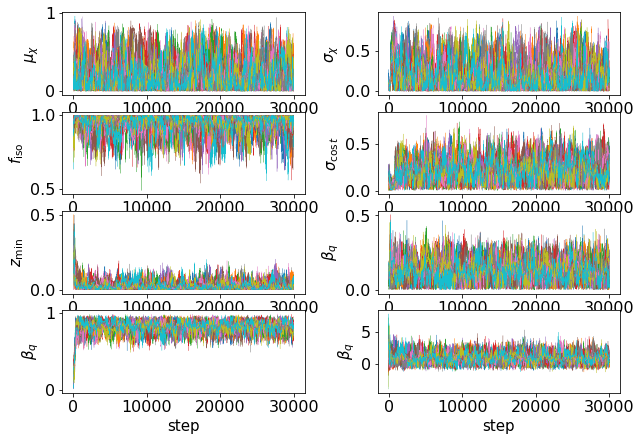

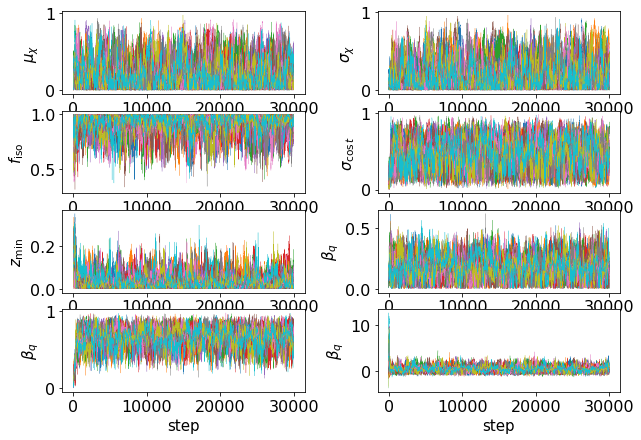

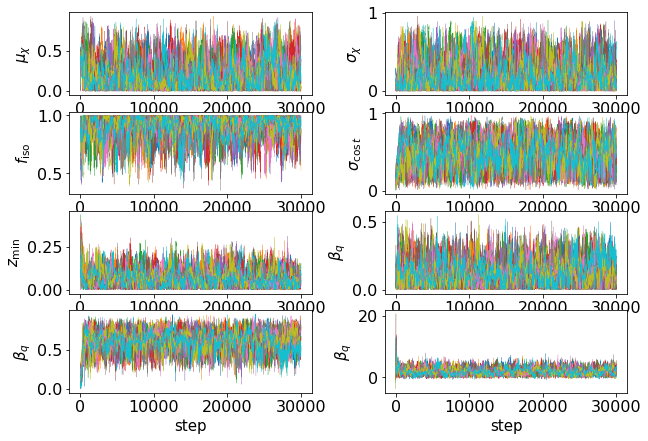

In [5]:
for i in np.arange(3):
    pop = str(i + 1)
    data = all_data[i]

    fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(10,7))

    # mu_chi
    for chain in data['chibin1']['unprocessed']:
        axes[0][0].plot(chain, lw=0.25)
    axes[0][0].set_ylabel(r'$\mu_\chi$', fontsize=15)

    # sigma_chi
    for chain in data['chibin2']['unprocessed']:
        axes[0][1].plot(chain, lw=0.25)
    axes[0][1].set_ylabel(r'$\sigma_\chi$', fontsize=15)

    # mixing fraction cos(theta) 
    for chain in data['chibin3']['unprocessed']:
        axes[1][0].plot(1-np.asarray(chain), lw=0.25)
    axes[1][0].set_ylabel(r'$f_\mathrm{iso}$', fontsize=15)

    # sigma_cos(theta)
    for chain in data['chibin4']['unprocessed']:
        axes[1][1].plot(chain, lw=0.25)
    axes[1][1].set_ylabel(r'$\sigma_{\cos t}$', fontsize=15)

    # min cos(theta)
    for chain in data['costbin1']['unprocessed']:
        axes[2][0].plot(chain, lw=0.25)
    axes[2][0].set_ylabel(r'$z_\mathrm{min}$', fontsize=15)

    # beta_q
    for chain in data['costbin2']['unprocessed']:
        axes[2][1].plot(chain, lw=0.25)
    axes[2][1].set_ylabel(r'$\beta_{q}$', fontsize=15)
    
    # beta_q
    for chain in data['costbin3']['unprocessed']:
        axes[3][0].plot(chain, lw=0.25)
    axes[3][0].set_ylabel(r'$\beta_{q}$', fontsize=15)
    
    # beta_q
    for chain in data['Bq']['unprocessed']:
        axes[3][1].plot(chain, lw=0.25)
    axes[3][1].set_ylabel(r'$\beta_{q}$', fontsize=15)

    for ax in axes: 
        for a in ax:
            a.set_xlabel('step', fontsize=15)       

    plt.subplots_adjust(wspace=0.3)
    # plt.suptitle(numinjections + ' Injections: Population ' + pop + ' Chains')
    plt.show()

Let's make a corner plot showing posteriors on our parameters:

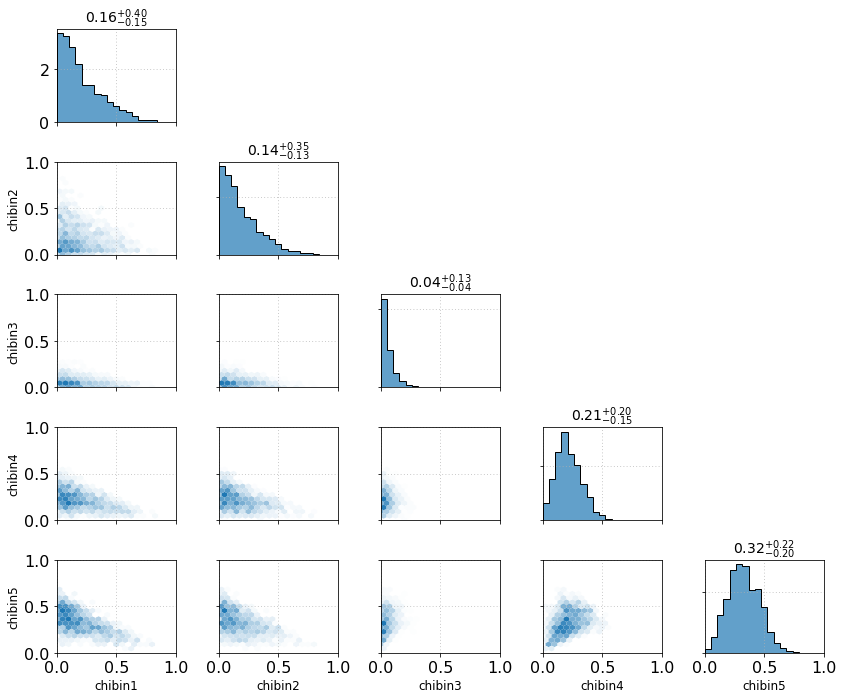

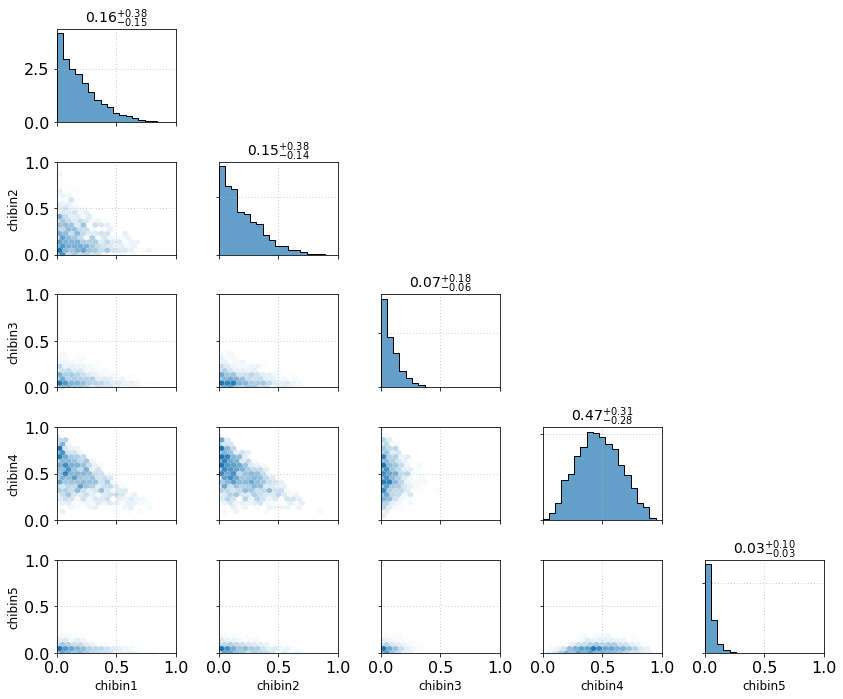

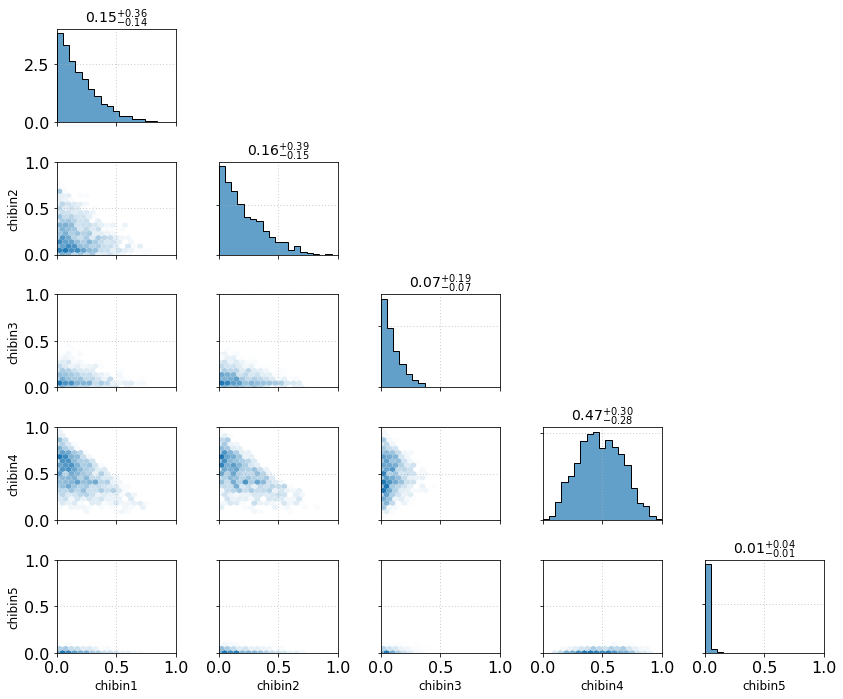

In [6]:
for i in np.arange(3):
    pop = str(i + 1)
    data = all_data[i]
    
    fig = plt.figure(figsize=(12,10))
    
    chibin1 = np.array(data['chibin1']['processed'])
    chibin2 = np.array(data['chibin2']['processed'])
    chibin3 = np.array(data['chibin3']['processed'])
    chibin4 = np.array(data['chibin4']['processed'])
    chibin5 = chibin1 + chibin2 + chibin3 + chibin4
    chibin5 = 1 - chibin5

    
    toPlot = {
        "chibin1":{"data":data['chibin1']['processed'], "plot_bounds":(0,1), "label":r"chibin1"},
        "chibin2":{"data":data['chibin2']['processed'], "plot_bounds":(0,1), "label":r"chibin2" },
        "chibin3":{"data":data['chibin3']['processed'], "plot_bounds":(0,1), "label":r"chibin3" },
        "chibin4":{"data":data['chibin4']['processed'], "plot_bounds":(0,1), "label":r"chibin4" }, 
        "chibin5":{"data":chibin5, "plot_bounds":(0,1), "label":r"chibin5" }, 
    }

    plot_corner(fig,toPlot,'#1f78b4',labelsize=12)
    plt.tight_layout()
    # plt.suptitle(numinjections + ' Injections: Population ' + pop + ' Corner Plot')
    plt.show()

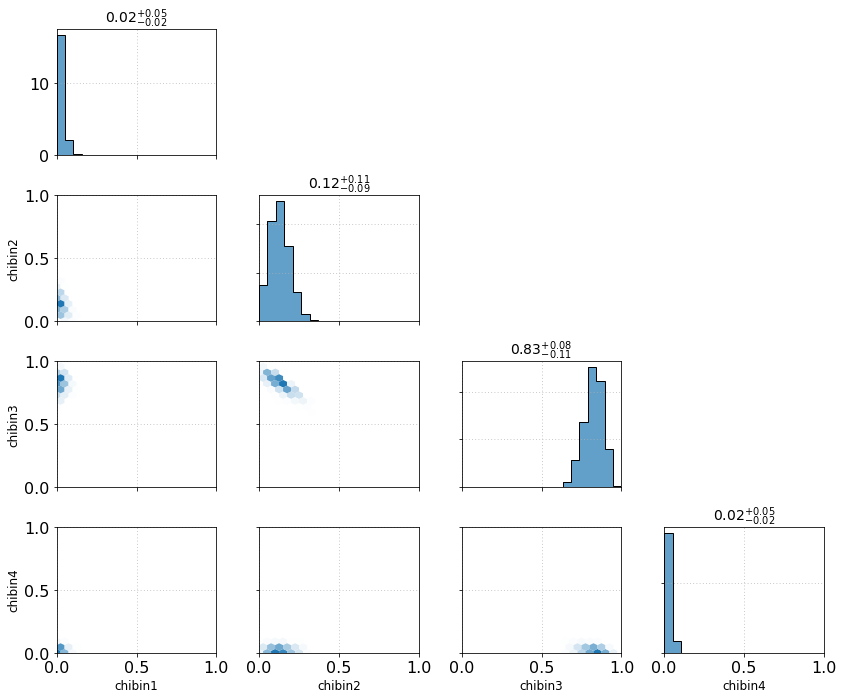

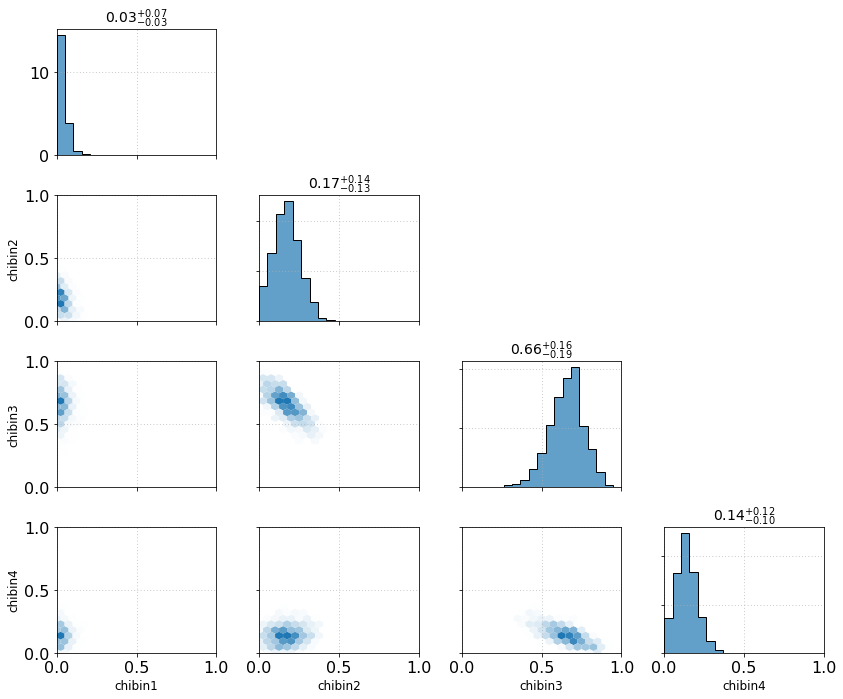

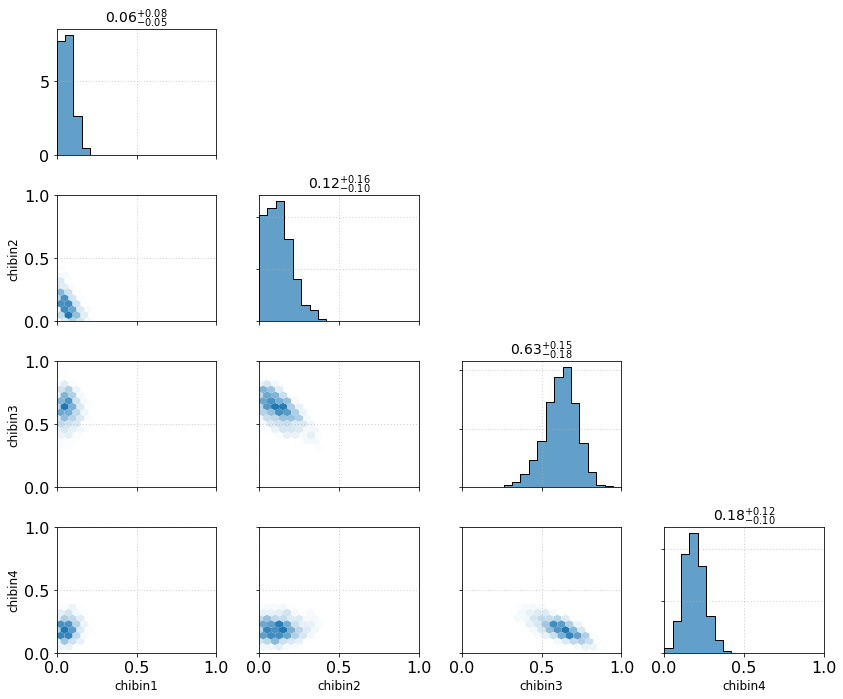

In [7]:
for i in np.arange(3):
    pop = str(i + 1)
    data = all_data[i]
    
    fig = plt.figure(figsize=(12,10))
    
    costbin1 = np.array(data['costbin1']['processed'])
    costbin2 = np.array(data['costbin2']['processed'])
    costbin3 = np.array(data['costbin3']['processed'])

    costbin4 = costbin1 + costbin2 + costbin3
    costbin4 = 1 - costbin4

    
    toPlot = {
        "chibin1":{"data":data['costbin1']['processed'], "plot_bounds":(0,1), "label":r"chibin1"},
        "chibin2":{"data":data['costbin2']['processed'], "plot_bounds":(0,1), "label":r"chibin2" },
        "chibin3":{"data":data['costbin3']['processed'], "plot_bounds":(0,1), "label":r"chibin3" },
        "chibin4":{"data":costbin4, "plot_bounds":(0,1), "label":r"chibin4" }, 
    }

    plot_corner(fig,toPlot,'#1f78b4',labelsize=12)
    plt.tight_layout()
    # plt.suptitle(numinjections + ' Injections: Population ' + pop + ' Corner Plot')
    plt.show()

Finally, let's make a "trace plot" showing the set of $\chi$ and $\cos \theta$ distributions corresponding to the above samples:

/home/zoe.ko/LIGOSURF22/data/70injections/../../scripts/posterior_helper_functions.py:295: RuntimeWarning: overflow encountered in exp
  f = np.exp(deltaM/m + deltaM/(m-deltaM))
/home/zoe.ko/LIGOSURF22/data/70injections/../../scripts/posterior_helper_functions.py:295: RuntimeWarning: overflow encountered in exp
  f = np.exp(deltaM/m + deltaM/(m-deltaM))
/home/zoe.ko/LIGOSURF22/data/70injections/../../scripts/posterior_helper_functions.py:295: RuntimeWarning: overflow encountered in exp
  f = np.exp(deltaM/m + deltaM/(m-deltaM))
/cvmfs/oasis.opensciencegrid.org/ligo/sw/conda/envs/igwn/lib/python3.9/site-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


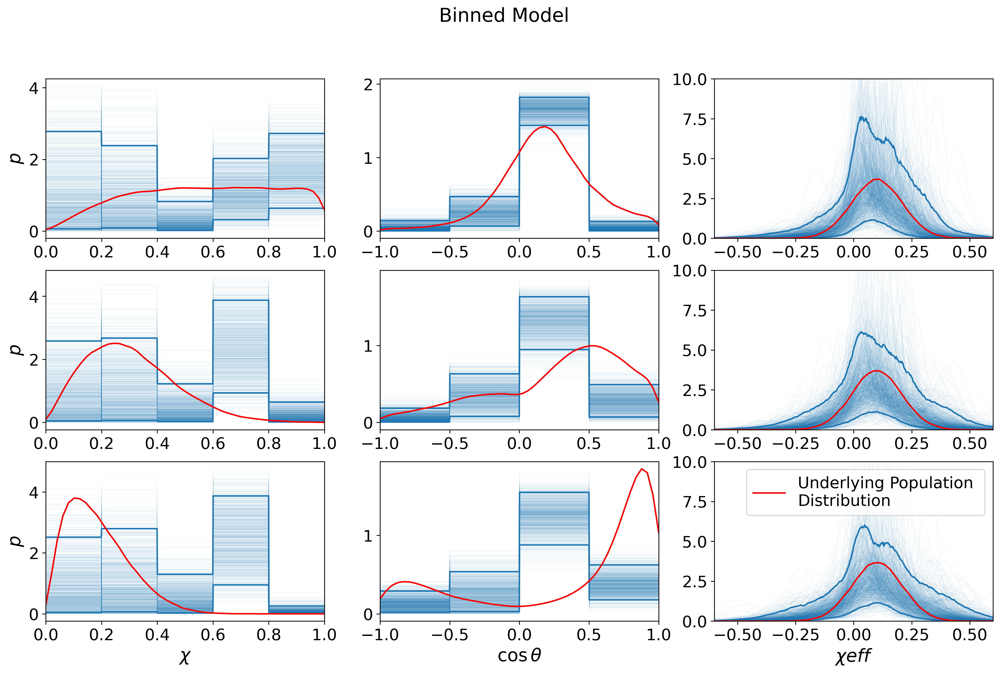

In [17]:
pop_kdes = '/home/zoe.ko/Xeff_injection_campaign/notebooks/pop_kdes/'

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(17,10), dpi=300)

for i in np.arange(3):
    int_pop = i
    pop = str(i + 1)
    data = all_data[i]

    # Define a grid of effective spins
    chi_grid = np.linspace(0,1,1000)
    cost_grid = np.linspace(-1,1,1000)

    # Choose a number of traces to draw
    nTraces = 1000

    # Instantiate an array to hold a collection of traces
    p_chi = np.zeros((nTraces,chi_grid.size))
    p_cost = np.zeros((nTraces,cost_grid.size))
    chieff_kdes_on_grid = np.zeros((nTraces,cost_grid.size))

    # For a random set of posterior samples, compute and store the corresponding probability densities across our grid
    random_indices = np.random.choice(np.arange(len(data['chibin1']['processed'])), size=nTraces,replace=False)
    for i,ind in enumerate(random_indices):

        chibin1 = data['chibin1']['processed'][ind]
        chibin2 = data['chibin2']['processed'][ind]
        chibin3 = data['chibin3']['processed'][ind]
        chibin4 = data['chibin4']['processed'][ind]
        chibin5 = chibin1 + chibin2 + chibin3 + chibin4
        chibin5 = 1 - chibin5
        chi_bins = [chibin1, chibin2, chibin3, chibin4, chibin5]
        
        costbin1 = data['costbin1']['processed'][ind]
        costbin2 = data['costbin2']['processed'][ind]
        costbin3 = data['costbin3']['processed'][ind]
        costbin4 = costbin1 + costbin2 + costbin3
        costbin4 = 1 - costbin4
        cost_bins = [costbin1, costbin2, costbin3, costbin4]

        # calculate beta distribution for chi
        p_chi[i,:] = calculate_Bins(chi_grid, chi_bins, chi_x_bins)

        # and gaussian + mixture for cos(theta)
        p_cost[i,:] = calculate_Bins(cost_grid, cost_bins, cost_x_bins)

        # TODO: import function
        # get it to match the other ones above

#         # draw 500 chi-effective samples corresponding to the component spin distributions with hyper-parameters
#         # {mu_chi, sigma_chi, MF_cost, sigma_cost, f_spike, sigma_spike, zmin, Bq,}
        chi_effs = drawChieffsBinned(chi_bins, cost_bins, chi_x_bins, cost_x_bins, data['Bq']['processed'][ind], n=500)

        # calculate KDE from these draws and evaluate them on a grid of chi-effective values (i.e. chieff_grid = 
        # np.linspace(-1,1,100)
        chieff_grid = np.linspace(-1,1,1000)
        chieff_kde = gaussian_kde(chi_effs)
        chieff_kdes_on_grid[i,:] = chieff_kde(chieff_grid)


        # draw samples from chi distribution, cos(theta) distirbution, mass distribtuion, calculte corresponding 
        # chi effective, do a kde
        # look at function from simona
        
    chi_x = np.linspace(0, 1)
    chieff_x = np.linspace(-.6, .6)
    cost_x = np.linspace(-1, 1)
    
    chi_kde = np.load(pop_kdes + 'pop' + pop + '_chi_kde.npy')
    chieff_kde = np.load(pop_kdes + 'pop' + pop + '_chieff_kde.npy')
    cost_kde = np.load(pop_kdes + 'pop' + pop + '_cost_kde.npy')
        

    # Plot individual traces
    axes[int_pop][0].plot(chi_grid, p_chi.T,color='#1f78b4', lw=0.15, alpha=0.15, zorder=0)
    axes[int_pop][0].plot(chi_x, chi_kde, color='red', label='Underlying Population \nDistribution')
    axes[int_pop][1].plot(cost_grid, p_cost.T,color='#1f78b4', lw=0.15, alpha=0.15, zorder=0)
    axes[int_pop][1].plot(cost_x, cost_kde, color='red', label='Underlying Population \nDistribution')
    axes[int_pop][2].plot(chieff_grid, chieff_kdes_on_grid.T,color='#1f78b4', lw=0.15, alpha=0.15, zorder=0)
    axes[int_pop][2].plot(chieff_x, chieff_kde, color='red', label='Underlying Population \nDistribution')
    
    # Also plot 5% and 95% credible bounds
    axes[int_pop][0].plot(chi_grid,np.quantile(p_chi,0.05,axis=0),color='#1f78b4',zorder=1)
    axes[int_pop][0].plot(chi_grid,np.quantile(p_chi,0.95,axis=0),color='#1f78b4',zorder=1)
    axes[int_pop][1].plot(cost_grid,np.quantile(p_cost,0.05,axis=0),color='#1f78b4',zorder=1)
    axes[int_pop][1].plot(cost_grid,np.quantile(p_cost,0.95,axis=0),color='#1f78b4',zorder=1)
    axes[int_pop][2].plot(chieff_grid,np.quantile(chieff_kdes_on_grid,0.05,axis=0),color='#1f78b4',zorder=1)
    axes[int_pop][2].plot(chieff_grid,np.quantile(chieff_kdes_on_grid,0.95,axis=0),color='#1f78b4',zorder=1)

    axes[int_pop][0].set_xlim(0,1)
    axes[int_pop][1].set_xlim(-1,1)
    axes[int_pop][2].set_xlim(-0.6,0.6)
    axes[int_pop][2].set_ylim(0,10)
    
axes[2][0].set_xlabel(r'$\chi$',fontsize=18)
axes[0][0].set_ylabel(r'$p$',fontsize=18)
axes[2][1].set_xlabel(r'$\cos \theta$',fontsize=18)
axes[1][0].set_ylabel(r'$p$',fontsize=18)
axes[2][2].set_xlabel(r'$\chi eff$',fontsize=18)
axes[2][0].set_ylabel(r'$p$',fontsize=18)
    # plt.suptitle(numinjections + ' Injections: Population ' + pop + ' Trace Plot')
plt.suptitle('Binned Model')
plt.legend()
plt.show()

# Make PP Plot

In [18]:
plt.rcParams.update({'font.size': 28})

In [19]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(37,20), dpi=300)

for runs in np.arange(100):
    all_chi1_pred = []
    all_chi2_pred = []
    all_cost1_pred = []
    all_cost2_pred = []
    all_chieff_pred = []

    all_chi1_obs = []
    all_chi2_obs = []
    all_cost1_obs = []
    all_cost2_obs = []
    all_chieff_obs = []

    for int_pop in np.arange(3):

        pop = str(int_pop+1)

        data = all_data[int_pop]

        chi1_pred = []
        chi2_pred = []
        cost1_pred = []
        cost2_pred = []
        chieff_pred = []

        # Define a grid of effective spins
        chi_grid = np.linspace(0,1,1000)
        cost_grid = np.linspace(-1,1,1000)

        # Choose a number of traces to draw
        nTraces = 70
        n = 1

        # Instantiate an array to hold a collection of traces
        p_chi = np.zeros((nTraces,chi_grid.size))
        p_cost = np.zeros((nTraces,cost_grid.size))
        chieff_kdes_on_grid = np.zeros((nTraces,cost_grid.size))

        # For a random set of posterior samples, compute and store the corresponding probability densities across our grid
        random_indices = np.random.choice(np.arange(len(data['chibin1']['processed'])), size=nTraces,replace=False)
        for i,ind in enumerate(random_indices):

            chibin1 = data['chibin1']['processed'][ind]
            chibin2 = data['chibin2']['processed'][ind]
            chibin3 = data['chibin3']['processed'][ind]
            chibin4 = data['chibin4']['processed'][ind]
            chibin5 = chibin1 + chibin2 + chibin3 + chibin4
            chibin5 = 1 - chibin5
            chi_bins = [chibin1, chibin2, chibin3, chibin4, chibin5]

            costbin1 = data['costbin1']['processed'][ind]
            costbin2 = data['costbin2']['processed'][ind]
            costbin3 = data['costbin3']['processed'][ind]
            costbin4 = costbin1 + costbin2 + costbin3
            costbin4 = 1 - costbin4
            cost_bins = [costbin1, costbin2, costbin3, costbin4]
            
            Bq = data['Bq']['processed'][ind]

            # calculate beta distribution for chi
            p_chi[i,:] = calculate_Bins(chi_grid, chi_bins, chi_x_bins)

            # and gaussian + mixture for cos(theta)
            p_cost[i,:] = calculate_Bins(cost_grid, cost_bins, cost_x_bins)

            # TODO: import function
            # get it to match the other ones above

            chi_effs = drawChieffsBinned(chi_bins, cost_bins, chi_x_bins, cost_x_bins, data['Bq']['processed'][ind], n=500)
            
            # draw uniform component spins + masses
            nRandomDraws = 10000
            samp_idxs = np.arange(nRandomDraws)
            chi1s = np.random.rand(nRandomDraws)
            chi2s = np.random.rand(nRandomDraws)
            cost1s = np.random.rand(nRandomDraws)*2 - 1
            cost2s = np.random.rand(nRandomDraws)*2 - 1
            mAs = np.random.rand(nRandomDraws)*100
            mBs = np.random.rand(nRandomDraws)*100
            m1s = np.maximum(mAs, mBs)
            m2s = np.minimum(mAs, mBs)

            p_chi1 = calculate_Bins(chi1s, chi_bins, chi_x_bins)
            p_chi2 = calculate_Bins(chi2s, chi_bins, chi_x_bins)
            p_cost1 = calculate_Bins(cost1s, cost_bins, cost_x_bins)
            p_cost2 = calculate_Bins(cost2s, cost_bins, cost_x_bins)
            p_masses = p_astro_masses(m1s, m2s, bq=Bq)

            weights = p_chi1*p_chi2*p_cost1*p_cost2*p_masses
            weights_normed = weights/np.sum(weights)
            weights_normed[np.where(weights_normed<0)] = 0 # get rid of tiny division errors

            # select a subset of the samples subject to the weights
            # calculated from p(spins,masses)
            idxs = np.random.choice(samp_idxs, p=weights_normed, size=n)  

            # calculate chi-eff for these samples
            q = m2s[idxs]/m1s[idxs]
            chi_eff = (chi1s[idxs]*cost1s[idxs] + q*chi2s[idxs]*cost2s[idxs])/(1+q)

            chi1 = chi1s[idxs]
            chi2 = chi2s[idxs]
            cost1 = cost1s[idxs]
            cost2 = cost2s[idxs]

            chi1_pred = np.append(chi1_pred, chi1)
            chi2_pred = np.append(chi2_pred, chi2)
            cost1_pred = np.append(cost1_pred, cost1)
            cost2_pred = np.append(cost2_pred, cost2)
            chieff_pred = np.append(chieff_pred, chi_eff)



            # draw 500 chi-effective samples corresponding to the component spin distributions with hyper-parameters
            # {mu_chi, sigma_chi, MF_cost, sigma_cost, f_spike, sigma_spike, zmin, Bq,}
            chi_effs = chi_effs = drawChieffsBinned(chi_bins, cost_bins, chi_x_bins, cost_x_bins, data['Bq']['processed'][ind], n=500)

                
            # calculate KDE from these draws and evaluate them on a grid of chi-effective values (i.e. chieff_grid = 
            # np.linspace(-1,1,100)
            chieff_grid = np.linspace(-1,1,1000)
            chieff_kde = gaussian_kde(chi_effs)
            chieff_kdes_on_grid[i,:] = chieff_kde(chieff_grid)



        all_chi1_pred += [chi1_pred]
        all_chi2_pred += [chi2_pred]
        all_cost1_pred += [cost1_pred]
        all_cost2_pred += [cost2_pred]
        all_chieff_pred += [chieff_pred]





        sampleDict_rw = np.load('/home/zoe.ko/LIGOSURF22/data/70injections/70beta_plus_mixture/pop' + pop
                                + 'rw_sampleDict.pickle', allow_pickle=True)
        chi1_obs = []
        chi2_obs = []
        cost1_obs = []
        cost2_obs = []
        chieff_obs = []

        for key in sampleDict_rw.keys():
            d = sampleDict_rw[key]
            chi1 = random.choice(d['chi1'])
            chi1_obs += [chi1]
            chi2 = random.choice(d['chi2'])
            chi2_obs += [chi2]
            cost1 = random.choice(d['cost1'])
            cost1_obs += [cost1]
            cost2 = random.choice(d['cost2'])
            cost2_obs += [cost2]


        all_chi1_obs += chi1_obs
        all_chi2_obs += chi2_obs
        all_cost1_obs += cost1_obs
        all_cost2_obs += cost2_obs
        all_chieff_obs += chieff_obs
    
        
        axes[int_pop][0].plot(np.sort(chi1_pred), np.sort(chi1_obs), alpha=0.3, c='cornflowerblue')
        axes[int_pop][0].plot(np.sort(chi1_pred), np.sort(chi1_pred), alpha = 0.3, ls='--', c='tomato')
        axes[int_pop][0].set_xlabel('Predicted Value')
        axes[int_pop][0].set_ylabel('Observed Value')
        axes[int_pop][0].set_title('Chi 1')
        
        axes[int_pop][1].plot(np.sort(chi2_pred), np.sort(chi2_obs), alpha=0.3, c='cornflowerblue')
        axes[int_pop][1].plot(np.sort(chi2_pred), np.sort(chi2_pred), alpha = 0.3, ls='--', c='tomato')
        axes[int_pop][1].set_xlabel('Predicted Value')
        axes[int_pop][1].set_ylabel('Observed Value')
        axes[int_pop][1].set_title('Chi 2')        

        axes[int_pop][2].plot(np.sort(cost1_pred), np.sort(cost1_obs), alpha=0.3, c='cornflowerblue')
        axes[int_pop][2].plot(np.sort(cost1_pred), np.sort(cost1_pred), alpha = 0.3, ls='--', c='tomato')
        axes[int_pop][2].set_xlabel('Predicted Value')
        axes[int_pop][2].set_ylabel('Observed Value')
        axes[int_pop][2].set_title('Cost 1')
        
        axes[int_pop][3].plot(np.sort(cost2_pred), np.sort(cost2_obs), alpha=0.3, c='cornflowerblue')
        axes[int_pop][3].plot(np.sort(cost2_pred), np.sort(cost2_pred), alpha = 0.3, ls='--', c='tomato')
        axes[int_pop][3].set_xlabel('Predicted Value')
        axes[int_pop][3].set_ylabel('Observed Value')
        axes[int_pop][3].set_title('Cost 2')

axes[0][0].set_ylabel('Pop 1: Observed Value')
axes[1][0].set_ylabel('Pop 2: Observed Value')
axes[2][0].set_ylabel('Pop 3: Observed Value')

plt.tight_layout()
plt.suptitle('Binned Model', y = 1.05)
plt.show()

/home/zoe.ko/LIGOSURF22/data/70injections/../../scripts/posterior_helper_functions.py:295: RuntimeWarning: overflow encountered in exp
  f = np.exp(deltaM/m + deltaM/(m-deltaM))
/home/zoe.ko/LIGOSURF22/data/70injections/../../scripts/posterior_helper_functions.py:295: RuntimeWarning: overflow encountered in exp
  f = np.exp(deltaM/m + deltaM/(m-deltaM))
/home/zoe.ko/LIGOSURF22/data/70injections/../../scripts/posterior_helper_functions.py:295: RuntimeWarning: overflow encountered in exp
  f = np.exp(deltaM/m + deltaM/(m-deltaM))
/home/zoe.ko/LIGOSURF22/data/70injections/../../scripts/posterior_helper_functions.py:295: RuntimeWarning: overflow encountered in exp
  f = np.exp(deltaM/m + deltaM/(m-deltaM))
/home/zoe.ko/LIGOSURF22/data/70injections/../../scripts/posterior_helper_functions.py:295: RuntimeWarning: overflow encountered in exp
  f = np.exp(deltaM/m + deltaM/(m-deltaM))
/home/zoe.ko/LIGOSURF22/data/70injections/../../scripts/posterior_helper_functions.py:295: RuntimeWarning: ove

## Look at actual injections

In [11]:
all_injections_data = []
all_event_names = []

for pop in np.array([1, 2, 3]):
    pop = str(pop)
    f = open('/home/zoe.ko/Xeff_injection_campaign/data/population' + pop + '.json')
    injections_data = json.load(f)
    all_injections_data += [injections_data]
    
    fname = '/home/zoe.ko/Xeff_injection_campaign/scripts/injlist_pop' + pop + '_' + numinjections + 'events.txt'
    lines = open(fname).read().splitlines()
    all_event_names += [lines]

In [12]:
all_injections_data_1 = all_injections_data[0]
all_injections_data_2 = all_injections_data[1]
all_injections_data_3 = all_injections_data[2]

all_event_names_1 = all_event_names[0]
all_event_names_2 = all_event_names[1]
all_event_names_3 = all_event_names[2]

In [13]:
injection_dfs = []

for i in np.arange(3):
    pop_df = pd.DataFrame(all_injections_data[i]).reset_index()
    df = pop_df.loc[pop_df['index'].isin(all_event_names[i])]
    injection_dfs += [df]

In [14]:
injection_dfs_1 = injection_dfs[0]
injection_dfs_2 = injection_dfs[1]
injection_dfs_3 = injection_dfs[2]

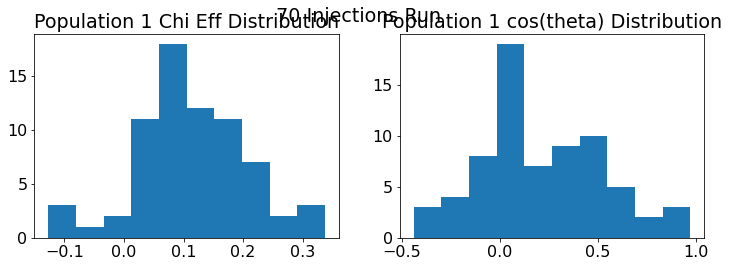

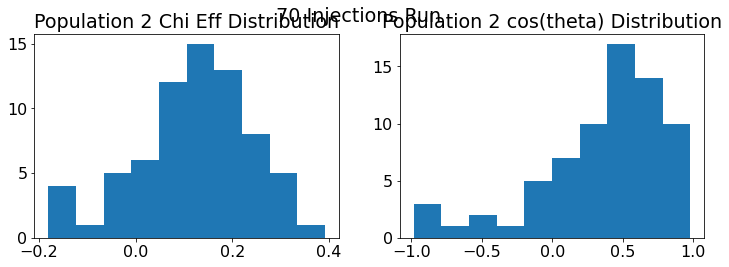

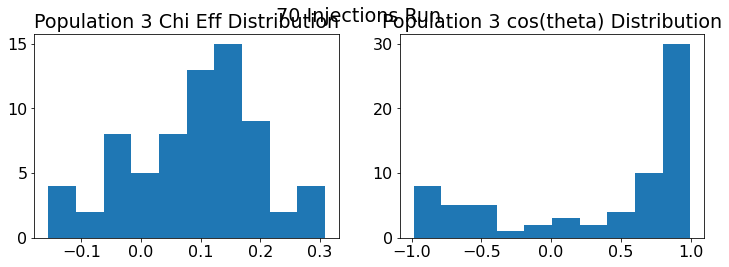

In [15]:
for i in np.arange(3):
    pop = str(i +1)
    pop_injections = injection_dfs[i]
    
    m1 = pop_injections['m1']
    m2 = pop_injections['m2']
    s1x = pop_injections['s1x']
    s1y = pop_injections['s1y']
    s1z = pop_injections['s1z']
    s2z = pop_injections['s2z']
    X1 = np.sqrt(s1x**2 + s1y**2 + s1z**2)

    chieff = (m1*s1z + m2*s2z)/(m1+m2)
    costheta = s1z/X1

    pop_injections = pop_injections.assign(chieff=chieff)
    pop_injections = pop_injections.assign(costheta=costheta)
    
    
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,3.75))

    axes[0].hist(pop_injections['chieff'])
    axes[0].set_title('Population ' + pop + ' Chi Eff Distribution')
    
    axes[1].hist(pop_injections['costheta'])
    axes[1].set_title('Population ' + pop + ' cos(theta) Distribution')
    plt.suptitle(numinjections + ' Injections Run')
    plt.show()